# Labellisez et appliquez des approches semi-supervisées en traitement d'images

**Contexte du Projet**

Entreprise : CurelyticsIA (Startup E-santé)

Mission : Automatiser la détection de tumeurs cérébrales pour assister les professionnels de santé.

Données : Jeu de données d'imagerie médicale (PNG + métadonnées). La majorité des images sont non étiquetées, seul un sous-ensemble restreint dispose d'annotations expertes (Normal / Cancéreux).


**Objectifs de la Mission**

Ce Notebook a pour but de réaliser une preuve de concept (PoC) visant à évaluer la faisabilité d'un passage à l'échelle. Les objectifs techniques sont les suivants :

- Exploration & Feature Extraction : Analyser la qualité des images et extraire des vecteurs de caractéristiques via un modèle pré-entraîné (ex: ResNet).
    
- Clustering Exploratoire : Identifier des structures naturelles dans les données non étiquetées pour générer des pseudo-labels ("labellisation faible").
    
- Apprentissage Semi-Supervisé : Entraîner un modèle CNN en combinant les labels experts ("forts") et les pseudo-labels ("faibles").
    
- Évaluation & Recommandation : Comparer les performances (Supervisé vs Semi-Supervisé) et recommander une stratégie de déploiement.

   

## Exploration du dataset

L'exploration du dataset est réalisé grâce au programme disponible sur src/exploration.py

Il utilise opencv pour la caractérisation des propriétés des images.

| Propriété            | Type            | Description                                                                            | Interprétation / Utilité                                                                                            |
| -------------------- | --------------- | -------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------- |
| **format**           | Catégoriel      | Format du fichier image (ex : PNG, JPG).                                               | Permet de vérifier l’homogénéité du dataset et détecter d’éventuelles différences de compression ou d’encodage.     |
| **width**            | Numérique       | Largeur de l’image en pixels.                                                          | Utile pour analyser la résolution des images et préparer le redimensionnement avant l’entraînement des modèles CNN. |
| **height**           | Numérique       | Hauteur de l’image en pixels.                                                          | Complète la largeur pour analyser la taille des images et calculer le ratio d’aspect.                               |
| **mode**             | Catégoriel      | Mode de couleur de l’image (ex : RGB, L).                                              | Permet de savoir si l’image contient plusieurs canaux couleur ou seulement un canal (niveau de gris).               |
| **size_bytes**       | Numérique       | Taille du fichier image sur le disque (en octets).                                     | Peut révéler des différences de compression ou d’information visuelle dans les images.                              |
| **is_grayscale**     | Booléen         | Indique si l’image RGB contient en réalité une information en niveaux de gris (R=G=B). | Permet d’identifier les images médicales stockées en RGB mais contenant une information grayscale.                  |
| **brightness**       | Numérique       | Moyenne des intensités des pixels (niveau de luminosité).                              | Permet de détecter les images trop sombres ou surexposées.                                                          |
| **contrast**         | Numérique       | Écart-type des intensités des pixels.                                                  | Mesure la variabilité des niveaux de gris ; un contraste faible indique une image visuellement plate.               |
| **sharpness**        | Numérique       | Variance du filtre Laplacien appliqué à l’image.                                       | Indicateur de netteté ; des valeurs faibles peuvent indiquer des images floues.                                     |
| **dark_ratio**       | Numérique (0–100) | Proportion de pixels dont l’intensité est inférieure à un seuil sombre (ex : <15%).     | Permet d’identifier les images contenant beaucoup de zones très sombres ou un fond noir dominant.                   |
| **bright_ratio**     | Numérique (0–100) | Proportion de pixels dont l’intensité dépasse un seuil lumineux (ex : >85%).           | Permet de détecter les zones saturées ou très lumineuses dans les images.                                           |
| **median_intensity** | Numérique       | Valeur médiane des intensités des pixels.                                              | Complète la luminosité moyenne pour mieux caractériser la distribution des intensités.                              |
| **bits**             | Numérique       | Profondeur de codage des pixels (ex : 8 bits).                                         | Indique la précision de représentation des niveaux d’intensité dans l’image.                                        |


Les informations sont regroupées dans un dataframe.




In [1]:

import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2

# Adapte the data path with your configuration
data_path = "../data"
df_images_filepath = os.path.join(data_path, "images.parquet")

# Load the dataframe with image list and basic informations
df_images = pd.read_parquet(df_images_filepath)
display(df_images)


# Création d'un dataframe de description des données, 
def describe_field(df):
    df_describ = pd.DataFrame({
        "name": df.columns,
        "dtype": df.dtypes.values,
        "unique_count": df.nunique(),
        "notna_count": df.notnull().sum().values,
    })
    # Ajout des descriptions données par la fonction describe() des champs numérique
    describe_numeric = df.describe().T.reset_index().drop(columns=['count'])
    df_describ = df_describ.merge(describe_numeric, left_on='name', right_on='index', how='left').drop(columns=['index'])
    return df_describ

df_describ = describe_field(df_images)
display(df_describ)

,path,filename,format,width,height,mode,size_bytes,is_grayscale,brightness,contrast,sharpness,dark_ratio,bright_ratio,median_intensity,bits,label
0,data/avec_labels/cancer,b6a41ca0-aeea-43a8-b629-7c433cf03143.jpg,jpg,512,512,RGB,20159,True,32,37,33,23,51,15,8,None
1,data/avec_labels/cancer,0f718241-8f63-4b55-81ce-315324b51069.jpg,jpg,512,512,RGB,18113,True,27,36,71,32,39,2,8,None
2,data/avec_labels/cancer,73352791-6331-48a0-b0d1-045fb31d376c.jpg,jpg,512,512,RGB,23490,True,40,44,102,27,52,22,8,None
3,data/avec_labels/cancer,d018fae6-42d9-4de3-acbf-6c2637c28482.jpg,jpg,512,512,RGB,23321,True,42,42,62,3,59,40,8,None
4,data/avec_labels/cancer,cb4e6fda-be13-454b-bbda-f75e184444d5.jpg,jpg,512,512,RGB,24468,True,53,41,49,2,73,60,8,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1501,data/sans_label,71334459-58f0-4373-8805-6100e6d9b5ed.jpg,jpg,512,512,RGB,27831,True,104,91,55,28,67,108,8,None
1502,data/sans_label,b5a05df2-50ea-435b-8946-f4ba1bb1d9ac.jpg,jpg,512,512,RGB,26169,True,64,49,53,22,73,83,8,None
1503,data/sans_label,b5b311b5-9264-4d34-a9a5-8952ecf727cb.jpg,jpg,512,512,RGB,22737,True,32,38,49,31,46,6,8,None
1504,data/sans_label,40b1313e-6c50-488f-9066-bfefc7c5b2e1.jpg,jpg,512,512,RGB,14638,True,22,31,26,33,39,2,8,None


,name,dtype,unique_count,notna_count,mean,std,min,25%,50%,75%,max
0,path,object,3,1506,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,filename,object,1506,1506,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,format,object,1,1506,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,width,int64,1,1506,512.000000,0.000000,512.0,512.00,512.0,512.00,512.0
4,height,int64,1,1506,512.000000,0.000000,512.0,512.00,512.0,512.00,512.0
5,mode,object,1,1506,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,size_bytes,int64,1361,1506,24749.329349,6264.723374,13373.0,21068.25,23838.0,27306.75,75454.0
7,is_grayscale,bool,2,1506,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,brightness,int64,97,1506,51.895750,17.379956,14.0,41.00,50.0,59.00,136.0
9,contrast,int64,72,1506,48.439575,13.717196,20.0,39.00,45.0,54.00,119.0


### Visualisation des caractéristiques

La visualisation des images permet d'évaluer la qualité des images. L'objectif est d'écarter les images de mauvaises qualités avant les traitements.

Property: brightness


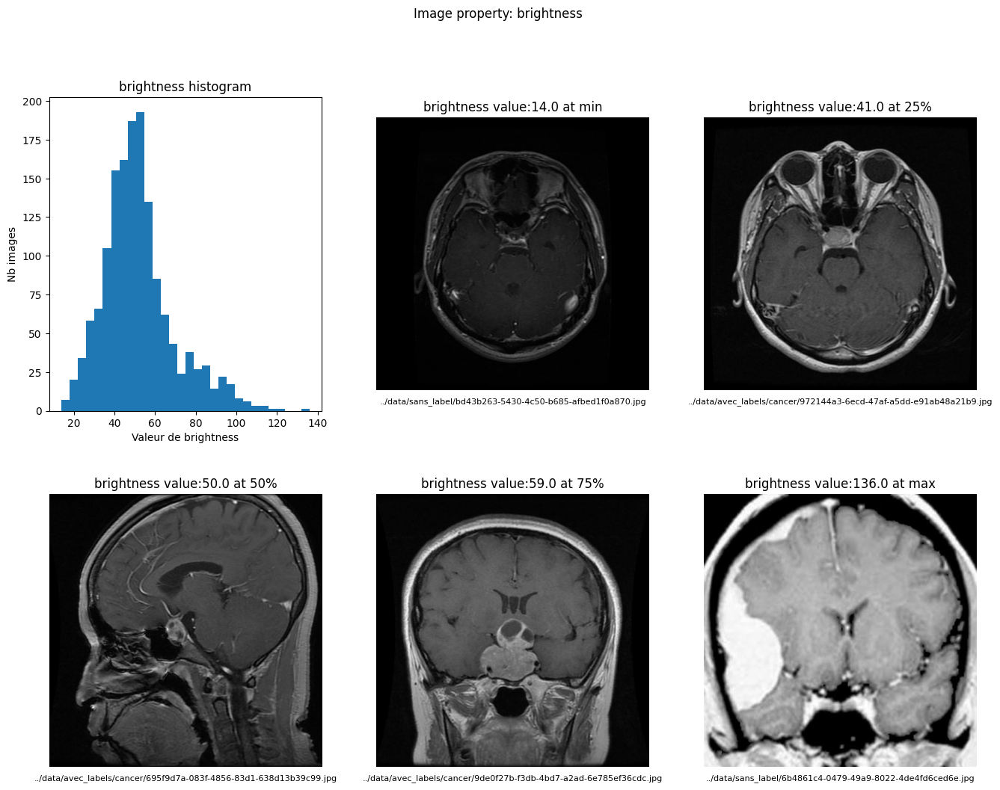

Property: contrast


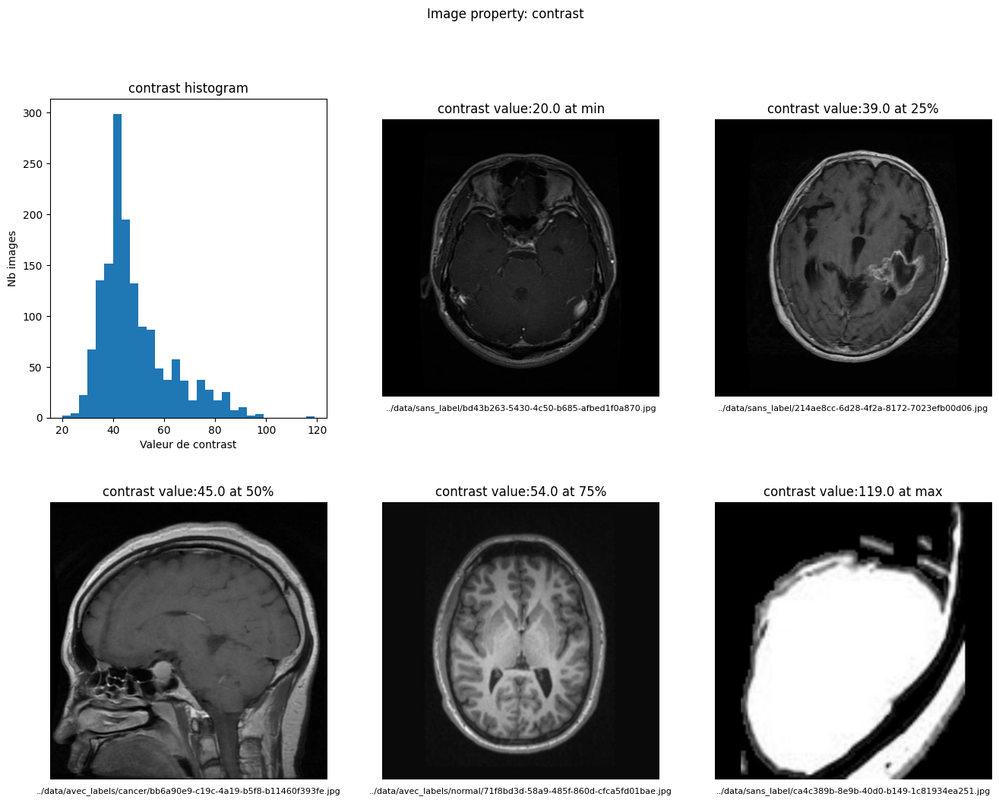

Property: sharpness


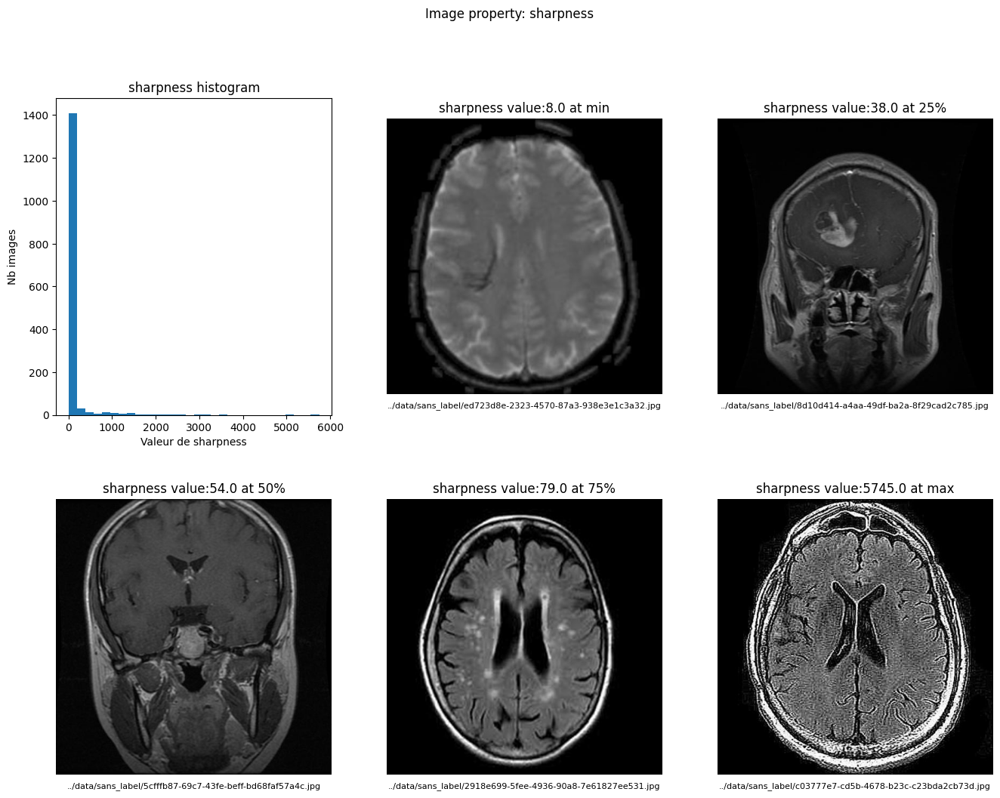

Property: dark_ratio


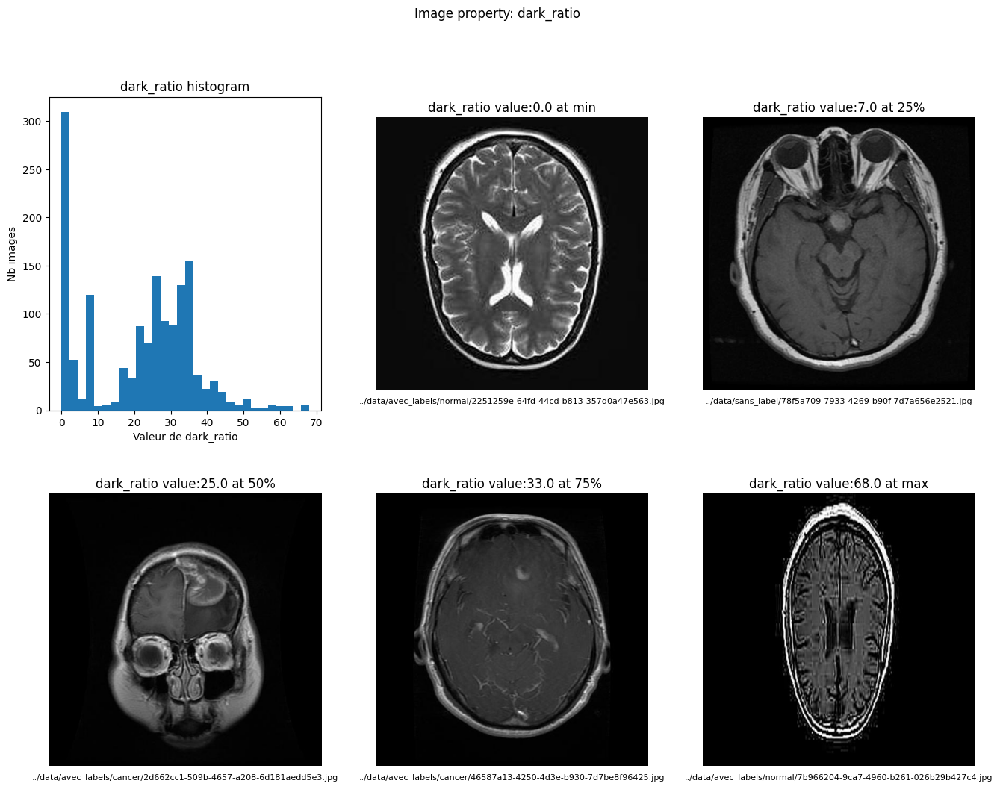

Property: bright_ratio


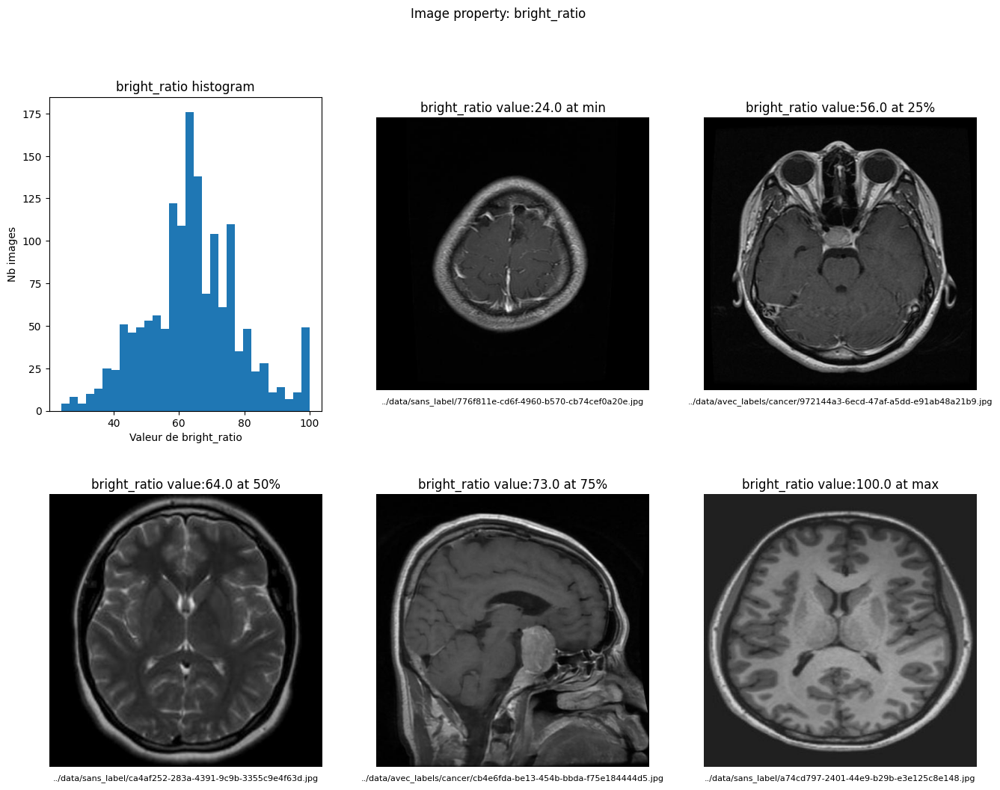

Property: median_intensity


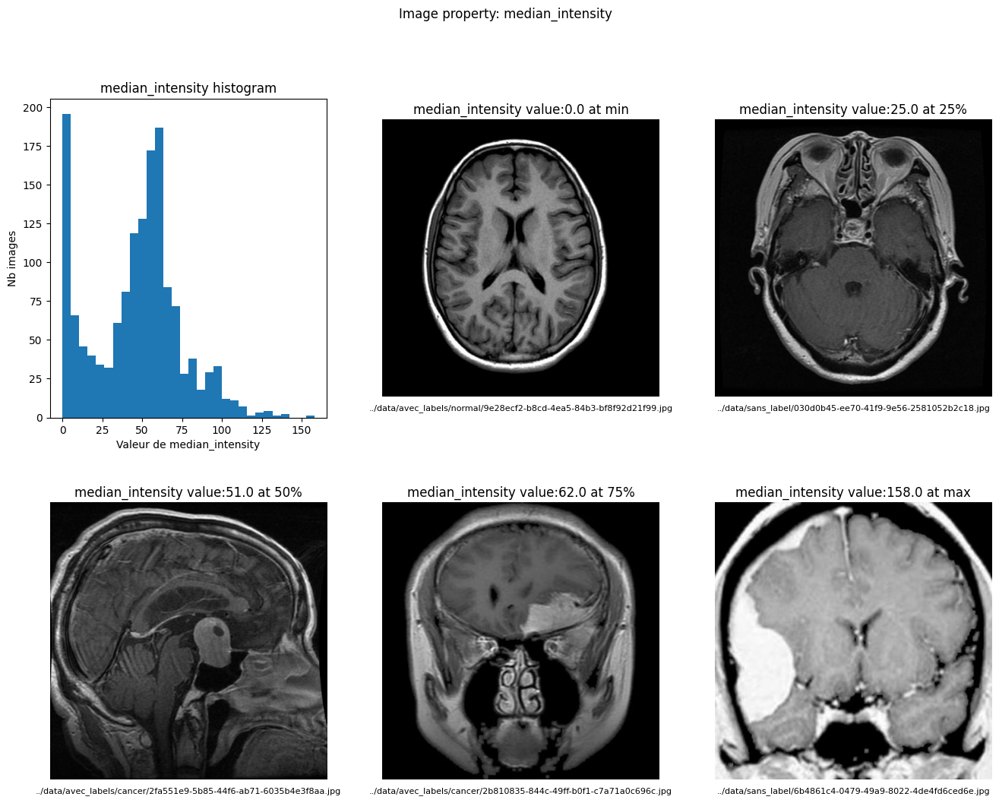

In [3]:


axs_row_max = 2
axs_col_max = 3


for img_property in ['brightness', 'contrast', 'sharpness', 'dark_ratio', 'bright_ratio', 'median_intensity']:

    fig, axs = plt.subplots(axs_row_max, axs_col_max, figsize=(16,12))
    fig.suptitle(f'Image property: {img_property}')
    
    axs[0, 0].hist(df_images[img_property].dropna(), bins=30)
    axs[0, 0].set_xlabel(f"Valeur de {img_property}")
    axs[0, 0].set_ylabel("Nb images")
    axs[0, 0].set_title(f"{img_property} histogram")
    
    property_row = df_describ.loc[(df_describ['name'] == img_property)].iloc[0]

    axs_row = 0
    axs_col = 1

    print("Property:", img_property)
    
    for seuil in ['min', '25%', '50%', '75%', 'max']:
        
        img_row = df_images.loc[(df_images[img_property] == property_row[seuil])]
        
        if len(img_row) >= 1:
            
            file_path = os.path.join("../", img_row.iloc[0]["path"], img_row.iloc[0]["filename"])
            img = cv2.imread(file_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axs[axs_row, axs_col].imshow(img)
            axs[axs_row, axs_col].set_title(f'{img_property} value:{property_row[seuil]} at {seuil}')
            axs[axs_row, axs_col].axis("off")
            axs[axs_row, axs_col].text(
                0.5, -0.05,
                file_path,
                transform=axs[axs_row, axs_col].transAxes,
                ha="center",
                fontsize=8
            )
            
            axs_col += 1
            if axs_col == axs_col_max:
                axs_col = 0
                axs_row += 1
            
    plt.show()
            

    

### Visualisation des outliers

La visualisation des outliers va permettre de définir les seuils qui déffinissent les images exploitables ou pas.
Les histogrammes ont déjà orienté les recherches, mantenant il faut affiner pour définir les seuils.
Un control visuel est réalisé pour valider les hypothèses.
 

In [54]:
def show_outliers(df_images, property_name, property_min, property_max, axs_col_max=4):
    """ Select the images in dataframe and show them """

    # Filter
    filter_min = (df_images[property_name] >= property_min)
    filter_max = (df_images[property_name] <= property_max)
    filter_img = (filter_min & filter_max)
    img_rows = df_images.loc[filter_img].sort_values(property_name)

    print(f'number of images:{len(img_rows)}')

    nb_image = len(img_rows)
    axs_row = 0
    axs_col = 0
    
    if nb_image:
        axs_row_max = nb_image / axs_col_max
        if float(axs_row_max) == float(int(axs_row_max)):
            axs_row_max = int(axs_row_max)
        else:
            axs_row_max = int(axs_row_max) + 1
            
        fig, axs = plt.subplots(axs_row_max, axs_col_max, figsize=(16, 5 * axs_row_max))
        fig.suptitle(f'Image property: {property_name}')

        for index, row in img_rows.iterrows():
            
            file_path = os.path.join("../", row["path"], row["filename"])
            img = cv2.imread(file_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axs[axs_row, axs_col].imshow(img)
            axs[axs_row, axs_col].set_title(f'{property_name}: {row[property_name]}')
            axs[axs_row, axs_col].axis("off")
            axs[axs_row, axs_col].text(
                0.5, -0.05,
                row["filename"],
                transform=axs[axs_row, axs_col].transAxes,
                ha="center",
                fontsize=8
            )
            
            axs_col += 1
            if axs_col == axs_col_max:
                axs_col = 0
                axs_row += 1
        
        while axs_col != axs_col_max and axs_col != 0:
            axs[axs_row, axs_col].axis("off")
            axs_col += 1

    plt.show()


    

#### brightness > 98

number of images:31


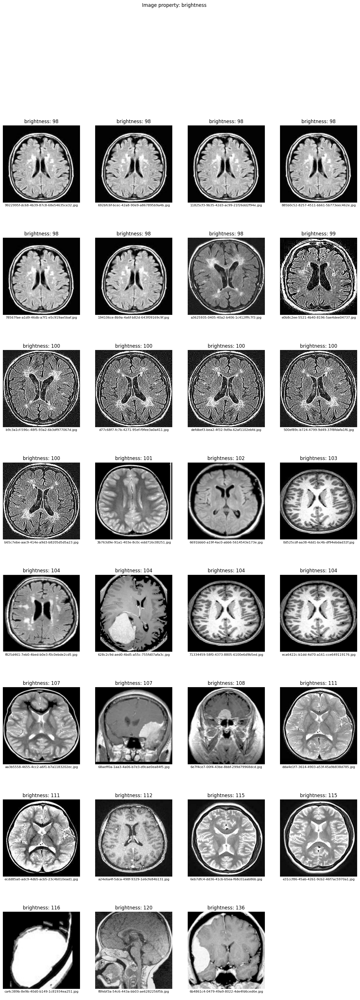

In [55]:
show_outliers(df_images, 'brightness', 98, 150)

#### contrast > 90

number of images:16


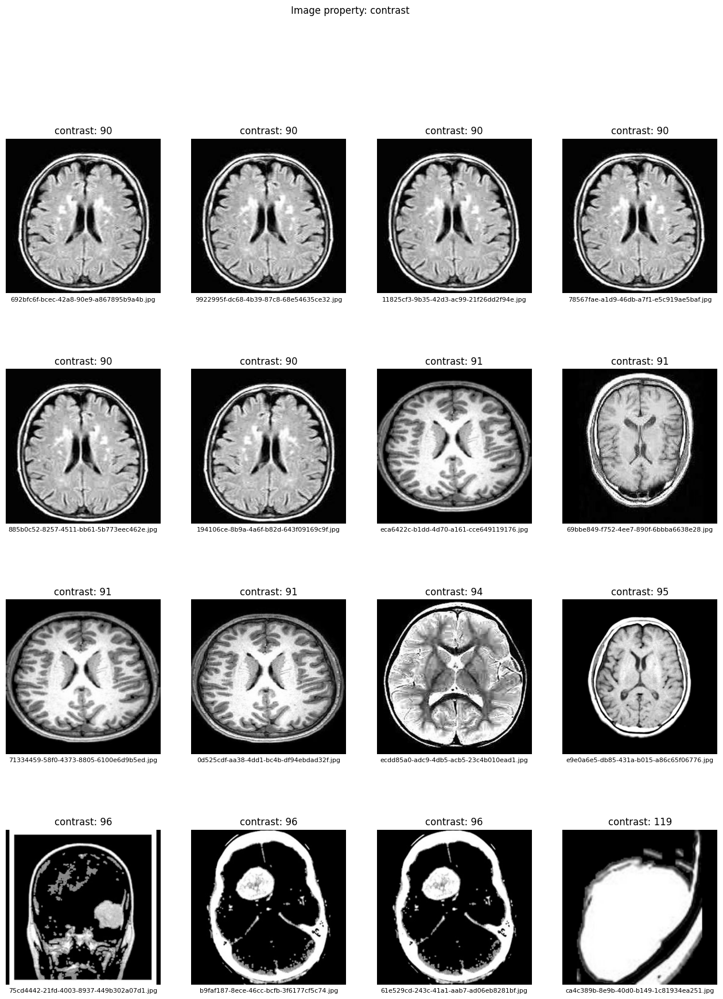

In [56]:
show_outliers(df_images, 'contrast', 90, 150)

### sharpness > 500

number of images:55


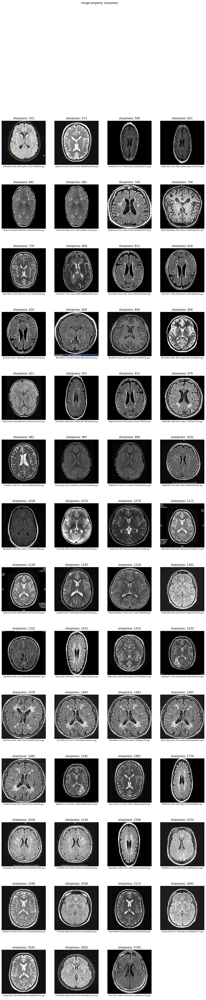

In [57]:
show_outliers(df_images, 'sharpness', 500, 10000)

### dark_ratio > 55

number of images:21


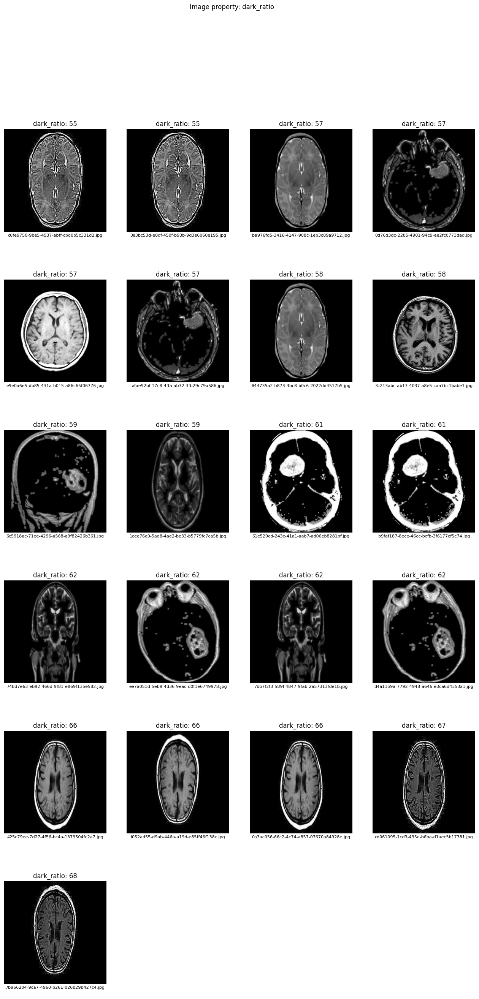

In [58]:
show_outliers(df_images, 'dark_ratio', 55, 100)

### bright_ratio < 31

number of images:16


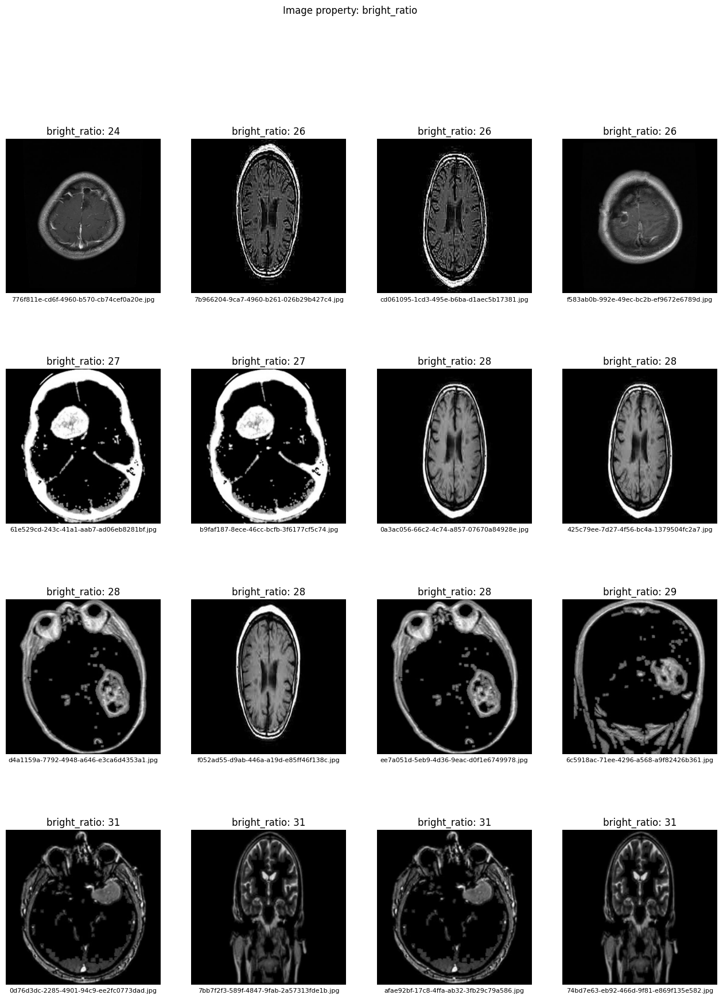

In [71]:
show_outliers(df_images, 'bright_ratio', 0, 31)

### median_intensity > 125

number of images:9


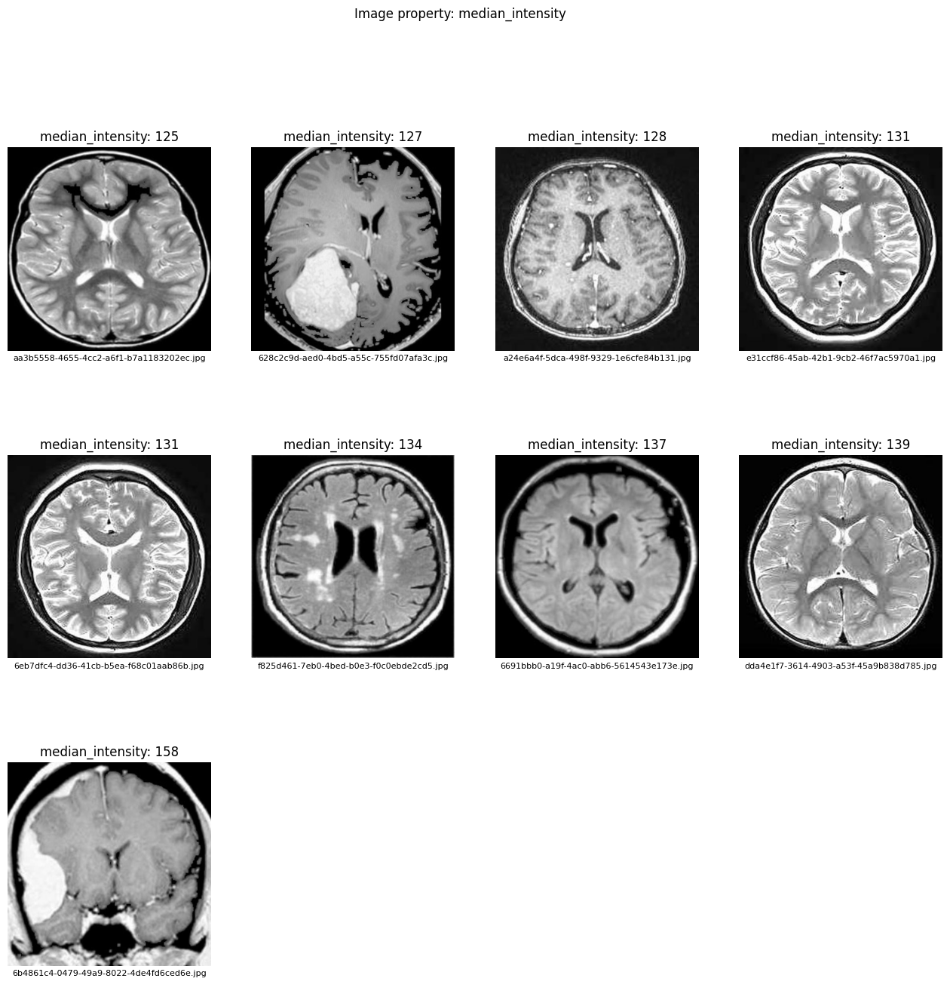

In [60]:
show_outliers(df_images, 'median_intensity', 125, 200)

## Conclusion

Voici la liste des images finalement retennues pour l'analyse suivante.

sur les 1506 images, 101 sont considérés comme outliers (6.7%)

Sur les images labélisée 'cancer', il n'y a pas d'images problèmatique.
Par contre, 14 images sur 50 (28%) labélisé "normale" sont à retiré suite à manque de qualité.

Les images validée vont être transformée en niveau de gris et redimenssionné en 224*224

Pour évaluer les temps nécessaires à 4 millions d'images, les temps ont été mesurés.


| Fonctions              | temps 1506 images  | Evaluation 4 M images     |
| ---------------------- | ------------------ | ------------------------- | 
| **Lister**             | 0.18 s             | 7.97 min                  |
| **Caractériser**       | 13.166 s           | 9 H  43 min               |
| **Labeliser**          | 1.129 s            | 50 min                    |


Pour caractériser les images sans optimisation du programme actuel, il faut donc prévoir une dizaine d'heures de traitement.


In [80]:
df_images = pd.read_parquet(df_images_filepath)

print("\nNombre d'images au format noir et blanc")
display(df_images["is_grayscale"].value_counts())

print("\nNombre d'images écartée de l'analyse (outliers)")
display(df_images["state"].value_counts())

print("\nRépartition des outliers par label")
display(df_images.groupby(["label", "state"]).size())






Nombre d'images au format noir et blanc


is_grayscale
True     1496
False      10
Name: count, dtype: int64


Nombre d'images écartée de l'analyse (outliers)


state
None       1405
outlier     101
Name: count, dtype: int64


Répartition des outliers par label


label   state  
None    None       1319
        outlier      87
cancer  None         50
normal  None         36
        outlier      14
dtype: int64